In [1]:
import glob
import plotly
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import Bio
import numpy as np
import scanpy as sc
from sklearn import preprocessing

from Bio.SeqUtils.ProtParam import ProteinAnalysis as PA
from Bio.SeqUtils.IsoelectricPoint import IsoelectricPoint as IP

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-qz6ohl7n because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Matplotlib is building the font cache; this may take a moment.


In [ ]:
from numba import cuda
print(cuda.gpus)

# Import Data

In [34]:
llr_dict = {protein.split('/')[-1].split('_')[0]:pd.read_csv(protein, index_col=[0]) for protein in glob.glob('../data/esm1b_preprs/*/*_heatmap_logits.csv')}

In [35]:
llr_dict.keys()

dict_keys(['P53', 'RASK', 'DNSL3', 'PDLIM3'])

In [24]:
embedding_dict = {umap.split('/')[-1].split('_')[0]:pd.read_csv(umap, index_col=[0]) for umap in glob.glob('../data/vae_model/*_umap.csv')}

In [25]:
embedding_dict.keys()

dict_keys(['P53', 'RASK', 'DNSL3', 'PDLIM3'])

In [43]:
adata = sc.read('../data/asp/FH6_1000L2_CN74_D1.h5ad')

In [57]:
GENE_NAME = 'PDLI3'
CLINVAR_LABEL_MAPPING = {
    'Pathogenic': 1,
    'Likely pathogenic': 1,
    'Pathogenic/Likely pathogenic': 1,
    'Benign': 0,
    'Likely benign': 0,
    'Benign/Likely benign': 0,
}

gene_eve_variants = pd.read_csv('../data/clinvar/%s_HUMAN.csv' % GENE_NAME)
gene_eve_variants['clinvar_label'] = gene_eve_variants['ClinVar_ClinicalSignificance'].map(CLINVAR_LABEL_MAPPING)
gene_eve_variants = gene_eve_variants[['position', 'mt_aa', 'clinvar_label']].dropna().rename(columns = \
        {'position': 'pos', 'mt_aa': 'alt_aa'})

In [67]:
embedding_dict['PDLIM3'] = embedding_dict['PDLIM3'].merge(gene_eve_variants, how = 'left')
display(embedding_dict['PDLIM3'])

,ref_index,name,pos,alt_aa,zeroshot_raw,zeroshot,dist_from_WT,umap1,umap2,clinvar_label
0,0,WT,NaN,NaN,0.000000,1.000000,0.000000,-5.213747,-8.076551,NaN
1,6917,WT,NaN,NaN,0.000000,1.000000,0.000000,-5.217478,-8.095791,NaN
2,1,M1V,1.0,V,-9.761526,0.593255,6.826495,2.079075,-5.867413,NaN
3,6918,M1V,1.0,V,-9.761526,0.593255,6.826495,2.075381,-5.862326,NaN
4,2,M1T,1.0,T,-11.531293,0.519512,7.365092,-11.818273,-0.923287,NaN
...,...,...,...,...,...,...,...,...,...,...
27663,13831,A364N,364.0,N,-5.227101,0.782196,3.256585,6.368363,-18.315790,NaN
27664,6915,A364D,364.0,D,-8.587594,0.642171,4.246437,-0.114062,-5.173239,NaN
27665,13832,A364D,364.0,D,-8.587594,0.642171,4.246437,-0.115769,-5.175222,NaN
27666,6916,A364L,364.0,L,-7.281904,0.696576,3.030806,4.980818,4.114937,NaN


# VariantFxViz

In [36]:
aa_list = ['K','R',
           'H','E',
           'D','N',
           'Q','T',
           'S','C',
           'G','A',
           'V','L',
           'I','M',
           'P','Y',
           'F','W']

aa_list = aa_list[::-1]

In [37]:
def _create_fig():
    return make_subplots(rows=11, cols=4,
                         shared_xaxes=False,
                         shared_yaxes=False,
                         vertical_spacing=.01,
                         specs=[[{"type": "heatmap","colspan":4, 'rowspan':4},{}, {}, {}],
                                [{}, None, None, None],
                                [{}, None, None, None],
                                [{}, None, None, None],
                                [{}, None, None, None],
                                [None, None, None, None],
                                [None, {"type":"scatter", 'rowspan':5, 'colspan':2}, {},{}],
                                [None, {}, None, None],
                                [None, {}, None, None],
                                [None, {}, None, None],
                                [None, {}, None, None]])
    
def _create_heatmap_trace(dms_df, visible=False):
    dms_df = dms_df.reindex(aa_list)

    x = list(dms_df)
    y = dms_df.index.tolist()
    z = dms_df.values

    hovertext = list()
    for yi, yy in enumerate(y):
        hovertext.append(list())
        for xi, xx in enumerate(x):
            hovertext[-1].append('x-aa: {}<br />y-aa: {}<br />logit: {}'.format(xx,yy, str(round(float(z[yi][xi]), 2))))
            
    return go.Heatmap(
        z = dms_df.values,
        x = x,
        y = y,
        hoverinfo='text',
        text=hovertext,
        colorscale='Viridis',
        visible=visible,
        reversescale=True,
        colorbar={'len':0.25, 'y':.85}
    )

def _create_scatter_trace(embedding_df, visible=False):
    hover_df = embedding_df[['umap1', 'umap2', 'name', 'pos', 'alt_aa', 'zeroshot_raw', 'zeroshot', 'dist_from_WT']]
    
    hovertext = list()
    for data in hover_df.values:
        hovertext.append('x: {}<br />y: {}<br />name: {}<br />pos: {}<br />alt_aa: {}<br />zeroshot_raw: {}<br />zeroshot: {}<br />dist_from_WT: {}'.format(str(round(data[0],2)), 
        str(round(data[1],2)), data[2], data[3], data[4], str(round(data[5],2)), str(round(data[6], 2)), str(round(data[7], 2))))
    
    return go.Scatter(x=embedding_df['umap1'],
                      y=embedding_df['umap2'],
                      hoverinfo='text',
                      text=hovertext,
                      mode='markers',
                      visible=visible,
                      marker=dict(color= embedding_df['zeroshot'].tolist(),
                           colorscale='Viridis', 
                           size=2, 
                           colorbar={'thickness':20, 'len':0.25, 'x':.8, 'y':.2}))

def _update_layout(fig, buttons=None, template=None, height=1000, width=1000, title='Variant Fx'):
    fig.update_layout(updatemenus=[dict(active=0,buttons=buttons)], height=height, width=width, title_text=title)
    if template:
        for theme in template:
            fig.update_layout(template=theme)

In [38]:
fig = _create_fig()

In [118]:
p53_heatmap = _create_heatmap_trace(llr_dict['P53'], visible=True)
fig.append_trace(p53_heatmap,1,1) # 0

p53_umap = _create_scatter_trace(embedding_dict['P53'], visible=True)
fig.append_trace(p53_umap, 7,2) # 1

In [119]:
rask_heatmap = _create_heatmap_trace(llr_dict['RASK'])
fig.append_trace(rask_heatmap,1,1) # 2

rask_umap  = _create_scatter_trace(embedding_dict['RASK'])
fig.append_trace(rask_umap, 7,2) # 3

In [ ]:
template = ['plotly', 'simple_white', 'plotly', 'simple_white']
buttons = list([dict(label="P53", method="update",
                     args=[{ "visible": [True, True, False, False]},
                           {"title": "P53",
                            "annotations": []}]),
                
                dict(label="RASK", method="update",
                     args=[{"visible": [False, False, True, True]},
                           {"title": "RASK",
                            "annotations": []}])])
_update_layout(fig, buttons, template)
plotly.offline.plot(fig, filename='dms_v0.2.1.html') 

In [139]:
def _create_fig():
    return make_subplots(rows=11, cols=6,
                         shared_xaxes=False,
                         shared_yaxes=False,
                         vertical_spacing=.01,
                         specs=[[{"type": "heatmap","colspan":6, 'rowspan':4},{}, {}, {}, {}, {}],
                                [{}, None, None, None, None, None],
                                [{}, None, None, None, None, None],
                                [{}, None, None, None, None, None],
                                [{}, None, None, None, None, None],
                                [None, None, None, None, None, None],
                                [{"type":"scatter", 'rowspan':4, 'colspan':2}, {}, {}, {"type":"scatter", 'rowspan':4, 'colspan':2},{},{}],
                                [None, {}, None, None, {}, None],
                                [None, {}, None, None, {}, None],
                                [None, {}, None, None, {}, None],
                                [None, {}, None, None, {}, None]])
    
def _create_heatmap_trace(dms_df, visible=False):
    dms_df = dms_df.reindex(aa_list)

    x = list(dms_df)
    y = dms_df.index.tolist()
    z = dms_df.values

    hovertext = list()
    for yi, yy in enumerate(y):
        hovertext.append(list())
        for xi, xx in enumerate(x):
            hovertext[-1].append('x-aa: {}<br />y-aa: {}<br />logit: {}'.format(xx,yy, str(round(float(z[yi][xi]), 2))))
            
    return go.Heatmap(
        z = dms_df.values,
        x = x,
        y = y,
        hoverinfo='text',
        text=hovertext,
        colorscale='Viridis',
        visible=visible,
        reversescale=True,
        colorbar={'len':0.25, 'y':.85}
    )

def _create_scatter_trace(embedding_df, visible=False):
    hover_df = embedding_df[['umap1', 'umap2', 'name', 'pos', 'alt_aa', 'zeroshot_raw', 'zeroshot', 'dist_from_WT']]
    
    hovertext = list()
    for data in hover_df.values:
        hovertext.append('x: {}<br />y: {}<br />name: {}<br />pos: {}<br />alt_aa: {}<br />zeroshot_raw: {}<br />zeroshot: {}<br />dist_from_WT: {}'.format(str(round(data[0],2)), 
        str(round(data[1],2)), data[2], data[3], data[4], str(round(data[5],2)), str(round(data[6], 2)), str(round(data[7], 2))))
    
    return go.Scatter(x=embedding_df['umap1'],
                      y=embedding_df['umap2'],
                      hoverinfo='text',
                      text=hovertext,
                      mode='markers',
                      visible=visible,
                      marker=dict(color= embedding_df['zeroshot'].tolist(),
                           colorscale='Viridis', 
                           size=2, 
                           colorbar={'thickness':20, 'len':0.25, 'x':.3, 'y':.3}))

def _isoelectricpoint_scale():
    seq = "MPQTVILPGPAPWGFRLSGGIDFNQPLVITRITPGSKAAAANLCPGDVILAIDGFGTESMTHADAQDRIKAAAHQLCLKIDRGETHLWSPQVSEDGKAHPFKINLESEPQDGNYFEHKHNIRPKPFVIPGRSSGCSTPSGIDCGSGRSTPSSVSTVSTICPGDLKVAAKLAPNIPLEMELPGVKIVHAQFNTPMQLYSDDNIMETLQGQVSTALGETPLMSEPTASVPPESDVYRMLHDNRNEPTQPRQSGSFRVLQGMVDDGSDDRPAGTRSVRAPVTKVHGGSGGAQRMPLCDKCGSGIVGAVVKARDKYRHPECFVCADCNLNLKQKGYFFIEGELYCETHARARTKPPEGYDTVTLYPKA"
    return Bio.SeqUtils.IsoelectricPoint.IsoelectricPoint(seq).pi()

def _create_st_scatter_trace(adata, gene, visible=False):
    st_df = pd.DataFrame(adata.X.todense(), columns=adata.var.index.tolist(), index=adata.obs.index.tolist())
    # st_df[gene] = [_isoelectricpoint_scale() * exp for exp in st_df[gene].tolist()]
    # color = [_isoelectricpoint_scale() * exp for exp in st_df[gene].tolist()]
    # min_max_scaler = preprocessing.MinMaxScaler()
    # color_scaled = min_max_scaler.fit_transform(st_df[gene].values.reshape(-1,1))
    return go.Scatter(x=adata.obs['new_x'],
                      y=adata.obs['new_y'],
                      mode='markers',
                      visible=visible,
                      marker=dict(color=st_df[gene].tolist(),
                           colorscale='Viridis', 
                           size=4, 
                           colorbar={'thickness':20, 'len':0.25, 'x':.85, 'y':.3})) 

def _update_layout(fig, buttons=None, template=None, height=1000, width=1000, title='Variant Fx'):
    fig.update_layout(updatemenus=[dict(active=0,buttons=buttons)], height=height, width=width, title_text=title)
    if template:
        for theme in template:
            fig.update_layout(template=theme)

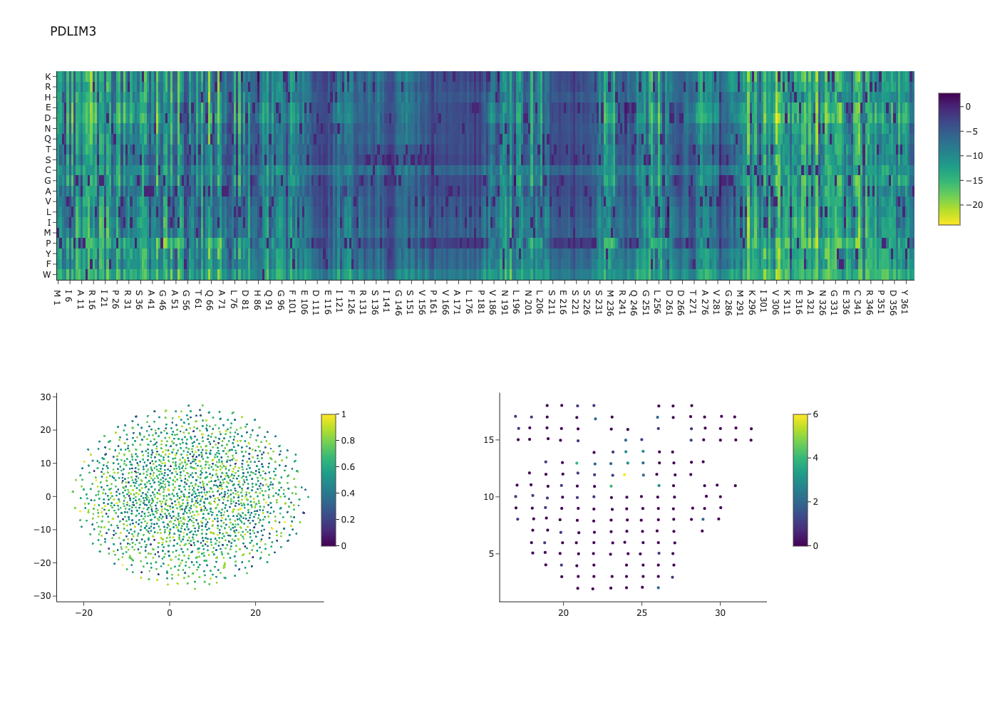

In [141]:
fig = _create_fig()
PDLIM3_heatmap = _create_heatmap_trace(llr_dict['PDLIM3'], visible=True)
PDLIM3_heatmap['showlegend'] = False
fig.append_trace(PDLIM3_heatmap,1,1)

PDLIM3_umap  = _create_scatter_trace(embedding_dict['PDLIM3'], visible=True)
PDLIM3_umap['showlegend'] = False
fig.append_trace(PDLIM3_umap, 7,1)

PDLIM3_st = _create_st_scatter_trace(adata, 'PDLIM3', visible=True)
PDLIM3_st['showlegend'] = False
fig.append_trace(PDLIM3_st, 7,4)

fig.update_layout(height=1000, width=1000, title_text='PDLIM3')
for x in ['plotly','simple_white']:
    fig.update_layout(template=x)
fig.update_layout(showlegend=False)

plotly.offline.plot(fig, filename='dms_st_PDLIM3_v0.2.2.html') 
fig.show()